# Does AWS's Rekognition Perpetuate Racial Stereotypes About Asians? 

## Problem definition: racial bias in AI for facial recognition 
The study by the National Institute of Standards and Technology (NIST) found that, when conducting a particular type of database search known as "one-to-one" matching, many facial recognition algorithms falsely identified African-American and Asian faces 10 to 100 times more than Caucasian faces. However, Amazon did not submit its facial recognition model for evaluation. 
In fact, an earlier assessment of Rekognition’s face-matching capability by the American Civil Liberties Union (ACLU), in which 28 members of Congress, disproportionately people of color, were incorrectly matched with mugshot images (https://sitn.hms.harvard.edu/flash/2020/racial-discrimination-in-face-recognition-technology/)
However, I believe that facial recognition AI typically has bias based on the data it is trained on. Since Amazon is an American company, its AI may not have a large proportion of Asian faces in its training data. But a Chinese company may design an AI algorithm that is only designed to distinguish Asian people apart; in one 2018 paper, “Facial feature discovery for ethnicity recognition,” AI researchers in China designed algorithms that could distinguish between the “facial landmarks” of Uighur, Korean and Tibetan faces (https://www.washingtonpost.com/technology/2020/12/08/huawei-tested-ai-software-that-could-recognize-uighur-minorities-alert-police-report-says/). 


# Question: does AWS’s Recognition have more trouble distinguishing Asians than people of other ethnicities? 




# Hypothesis: 
Similarity scores for a pair of doppleganger Asian celebrities will be higher than similarity scores for a pair of doppleganger white celebrities of roughly the same age, gender, and nationality.


In [1]:
import os
import subprocess
import re
import numpy as np
import s3fs
from PIL import Image

## First, make an s3 bucket where our images will be stored

Run the command mb below to make a new bucket. Make sure your bucket name is unique!

In [2]:
face_bucket = 'asian-faces-bucket'
!aws s3 mb s3://$face_bucket

# This is the AWS CLI command to create an S3 bucket. 
# The mb stands for "make bucket," and it's used to create a new S3 bucket.
# 's3://asian-faces-bucket' indicates that we're making our bucket in s3, and the part after the '//' is the name of the bucket


make_bucket: asian-faces-bucket


In [3]:
!aws s3 ls 
# Here we list the contents of your account
# We should see that the bucket we just created is listed here. 

2023-10-31 15:15:52 asian-faces-bucket
2023-10-31 15:05:20 faces54-bucket
2023-10-26 15:05:19 homeworkbucket57
2023-10-24 14:49:32 project-template-qtm350


Next, we need to add an image to this bucket. 
We will do this using the AWs CLI. 

First, using the JupyterLab file viewer on the left, click the up arrow symbol to upload a file to your Sagemaker instance. Upload either a .jpg or a .png. 
Now move this file to your bucket using the aws s3 mv command. 



In [4]:
foldername = 'ChinaCelebs' # replace this string with the name of the folder containing your images
!ls $foldername 
!aws s3 mv ./$foldername s3://$face_bucket/ --recursive # move the contents of the folder into the s3 bucket




View contents of bucket now

In [5]:
!aws s3 ls $face_bucket

2023-11-04 18:43:23       3450 arthurchen1.jpeg
2023-11-04 18:43:23       4696 arthurchen2.jpeg
2023-11-04 18:43:23       5258 arthurchen3.jpeg
2023-11-04 18:43:23       5508 arthurchen4.jpeg
2023-11-04 18:43:23       8831 arthurchen5.jpeg
2023-11-02 00:34:14       9080 cherie1.jpg
2023-11-02 00:34:14    1018825 cherie10.jpg
2023-11-02 00:34:14       6100 cherie2.jpg
2023-11-02 00:34:14       5900 cherie3.jpg
2023-11-02 00:34:14      42077 cherie4.jpg
2023-11-02 00:34:14    1265372 cherie4.png
2023-11-02 00:34:14      51921 cherie5.jpg
2023-11-02 00:34:14      14852 cherie6.jpg
2023-11-02 00:34:14      10124 cherie8.jpg
2023-11-02 00:34:14      34845 cherie9.jpg
2023-11-02 00:34:14      56553 joey1.jpg
2023-11-02 00:34:14       5371 joey10.jpeg
2023-11-02 00:34:14      26623 joey2.jpg
2023-11-02 00:34:14     913770 joey3.png
2023-11-02 00:34:14      16000 joey4.jpg
2023-11-02 00:34:14      51776 joey5.jpg
2023-11-02 00:34:14      24011 joey6.jpg
2023-11-02 00:34:14      59446 joey7.jpg

# Use the Python SDK

In [6]:
# We start by importing the package which containts the code for the Python SDK, boto3.

#Copyright 2018 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-developer-guide/blob/master/LICENSE-SAMPLECODE.)

import boto3

Next, we create an instance client of the client object in the boto3 package for rekognition. It will allow use to communicate and make requests to the Rekognition service using Python.



In [7]:
client=boto3.client('rekognition')
fs = s3fs.S3FileSystem(anon=False)

# Does Rekognition's celebrity recognition method recognize and distinguish these Chinese Celebrities?

## We've selected 3 pairings of Chinese lookalikes, with photos matched roughly in age. 
## Female:

Sun Yi vs Li Qin 

Zhou Ye vs Zhang Jingyi

Zhang Ziyi vs Tong Yao


## Male

Yang Yang vs Xing Zhaolin

Lu Han vs Neo Hou Minghao

Arthur Chen vs Kris Wu


Here, I've added some code to automate the process of creating a list of strings (each string is an image name)

In [8]:
# Run the AWS CLI command to list files in the S3 bucket
command = f'aws s3 ls s3://{face_bucket}'

try:
    result = subprocess.check_output(command, shell=True, text=True)
    file_list = result.strip().split('\n')
except subprocess.CalledProcessError as e:
    print(f"Error listing files in the S3 bucket: {e}")
    file_list = []
    
# Now, file_list contains a list of strings, each representing a file in the S3 bucket
file_names = [line.split()[-1] for line in file_list]
file_names


['arthurchen1.jpeg',
 'arthurchen2.jpeg',
 'arthurchen3.jpeg',
 'arthurchen4.jpeg',
 'arthurchen5.jpeg',
 'cherie1.jpg',
 'cherie10.jpg',
 'cherie2.jpg',
 'cherie3.jpg',
 'cherie4.jpg',
 'cherie4.png',
 'cherie5.jpg',
 'cherie6.jpg',
 'cherie8.jpg',
 'cherie9.jpg',
 'joey1.jpg',
 'joey10.jpeg',
 'joey2.jpg',
 'joey3.png',
 'joey4.jpg',
 'joey5.jpg',
 'joey6.jpg',
 'joey7.jpg',
 'joey8.jpeg',
 'joey9.jpeg',
 'kriswu1.jpeg',
 'kriswu2.jpeg',
 'kriswu3.jpeg',
 'kriswu4.jpeg',
 'kriswu5.jpeg',
 'liqin1.jpg',
 'liqin2.jpeg',
 'liqin3.jpeg',
 'liqin4.jpeg',
 'liqin5.jpeg',
 'luhan1.jpeg',
 'luhan2.jpeg',
 'luhan3.jpeg',
 'luhan4.jpeg',
 'luhan5.jpeg',
 'neohouminghao1.jpeg',
 'neohouminghao2.jpeg',
 'neohouminghao3.jpeg',
 'neohouminghao4.jpeg',
 'neohouminghao5.jpeg',
 'sunyi1.jpeg',
 'sunyi2.jpg',
 'sunyi3.jpeg',
 'sunyi4.jpeg',
 'sunyi5.jpeg',
 'tongyao1.jpeg',
 'tongyao2.jpeg',
 'tongyao3.jpeg',
 'tongyao4.jpeg',
 'tongyao5.jpg',
 'xingzhaolin1.jpeg',
 'xingzhaolin2.jpeg',
 'xingzhaolin3

In [9]:
def recognize_celeb(celeb : str):
    """
    Recognize celebrities in images containing the specified celebrity name.

    Parameters:
    celeb (str): The celebrity name to search for in image filenames.

    Returns:
    dictionary: 
    
    The function searches for images in a list of file names that contain the specified celebrity name.
    It then uses a recognition service to identify celebrity faces in each image.
    For each image, the recognized celebrity names and matching confidence scores are stored as a tuple 
    If no celebrity matches are found, store (None, 0)
    
    Note:
    - You need to have the 'client' and other required variables set up for this function to work correctly.
    - The function does not include code to visualize each image being compared per iteration. You can add that functionality separately.
    """
    confidence_dict = {}
    celeb_pics = [file for file in file_names if celeb in file]
    for pic in celeb_pics: 
        response = client.recognize_celebrities(Image={'S3Object':{'Bucket': face_bucket,'Name': pic}})
        if 'CelebrityFaces' in response and response['CelebrityFaces'] != []:
            for celebrity in response['CelebrityFaces']:
                # Access keys you want from the response
                match_name = celebrity.get('Name')
                confidence_score = celebrity.get('MatchConfidence')
                # Process the keys as needed
                print(f"File: {pic}, Match Name: {match_name}, Match Confidence: {confidence_score}")  
                confidence_dict[pic] = (match_name, confidence_score)

        else: 
            print('No celebrity matches found')
            match_name = None
            confidence_score = 0 
            confidence_dict[pic] = (match_name, confidence_score)

        with fs.open(f's3://{face_bucket}/{pic}') as f:
                    display(Image.open(f))
        
    return confidence_dict




In [10]:
def compare_celebs(celeb1: str, celeb2: str):
    celeb1_images = [file for file in file_names if celeb1 in file]   
    celeb2_images = [file for file in file_names if celeb2 in file]    
    celeb1_images = np.random.permutation(celeb1_images)
    celeb2_images = np.random.permutation(celeb2_images)
    similarity_confidence = {}
    for i in range(len(celeb1_images)): 
        # Compare the faces
        response = client.compare_faces(
            SourceImage={'S3Object': {'Bucket': face_bucket, 'Name': celeb1_images[i]}},
            TargetImage={'S3Object': {'Bucket': face_bucket, 'Name': celeb2_images[i] }},
        SimilarityThreshold=20  # Optional: Adjust the similarity threshold as needed
        )
        with fs.open(f's3://{face_bucket}/{celeb1_images[i]}') as f:
            display(Image.open(f))
        with fs.open(f's3://{face_bucket}/{celeb2_images[i]}') as f:
            display(Image.open(f))

        # Check if any faces are matched
        if response['FaceMatches']:
            for match in response['FaceMatches']:
                similarity = match['Similarity']
                confidence = match['Face']['Confidence']
                print(f"Similarity: {similarity}% (Confidence: {confidence}%)")
                similarity_confidence[f"{celeb1_images[i]}, {celeb2_images[i]}"] = similarity, confidence
        else:
            print("No matching faces found.")
            similarity_confidence[f"{celeb1_images[i]}, {celeb2_images[i]}"] = None, 0

    return similarity_confidence

# Does Rekognition's celebrity recognition method recognize Sun Yi?

First, here is a photo of Sun Yi

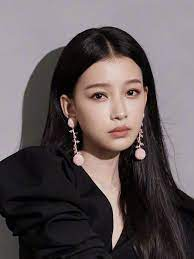

File: sunyi1.jpeg, Match Name: Elva Ni, Match Confidence: 89.47757720947266


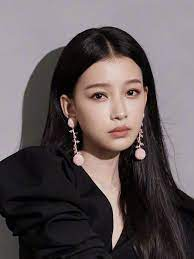

File: sunyi2.jpg, Match Name: Zhang Dayi, Match Confidence: 87.93253326416016


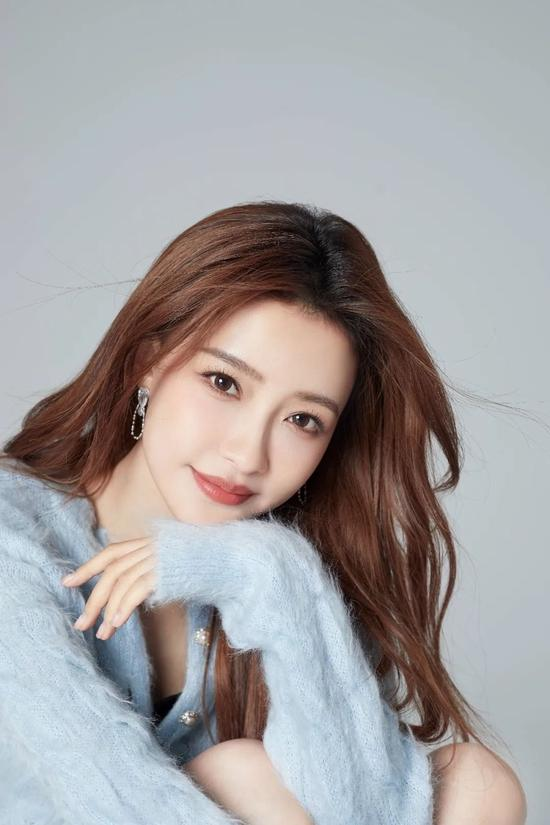

File: sunyi3.jpeg, Match Name: Elva Ni, Match Confidence: 90.57418060302734


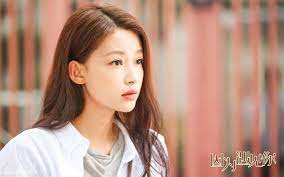

File: sunyi4.jpeg, Match Name: Elva Ni, Match Confidence: 75.5894775390625


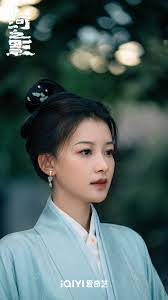

No celebrity matches found


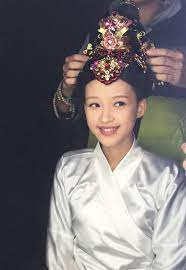

{'sunyi1.jpeg': ('Elva Ni', 89.47757720947266),
 'sunyi2.jpg': ('Zhang Dayi', 87.93253326416016),
 'sunyi3.jpeg': ('Elva Ni', 90.57418060302734),
 'sunyi4.jpeg': ('Elva Ni', 75.5894775390625),
 'sunyi5.jpeg': (None, 0)}

In [11]:
recognize_celeb('sunyi')

# Clearly, Rekognition Confused Sun Yi with Other Chinese Celebrities

# Does Rekognition's celebrity recognition method recognize Li Qin ?


File: liqin1.jpg, Match Name: Li Qin, Match Confidence: 97.8695068359375


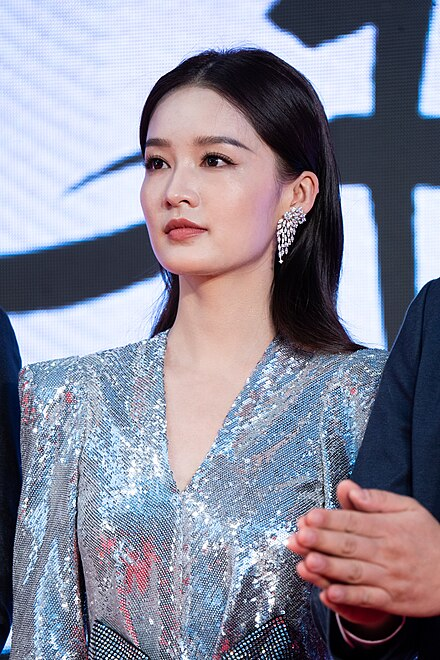

File: liqin2.jpeg, Match Name: Li Qin, Match Confidence: 86.38887786865234


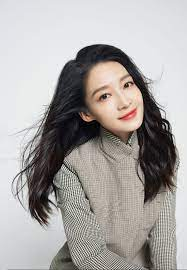

File: liqin3.jpeg, Match Name: Li Qin, Match Confidence: 89.67774200439453


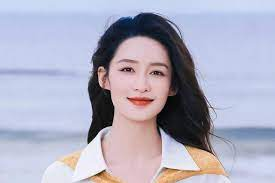

File: liqin4.jpeg, Match Name: Angel Wang, Match Confidence: 94.04505157470703


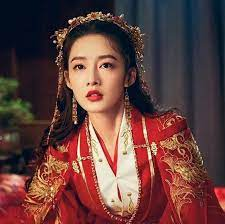

File: liqin5.jpeg, Match Name: Zhang Dayi, Match Confidence: 93.45579528808594


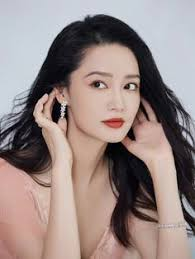

{'liqin1.jpg': ('Li Qin', 97.8695068359375),
 'liqin2.jpeg': ('Li Qin', 86.38887786865234),
 'liqin3.jpeg': ('Li Qin', 89.67774200439453),
 'liqin4.jpeg': ('Angel Wang', 94.04505157470703),
 'liqin5.jpeg': ('Zhang Dayi', 93.45579528808594)}

In [12]:
recognize_celeb('liqin') 

# Comparing faces (Sun Yi vs Li Qin)
Chinese netizens think that these two celebrities look alike. Here we'll test if Rekognition can tell them apart. 


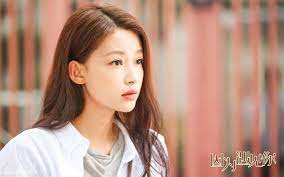

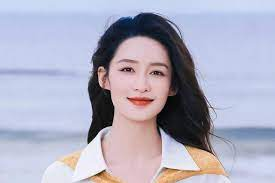

Similarity: 36.197166442871094% (Confidence: 99.99784088134766%)


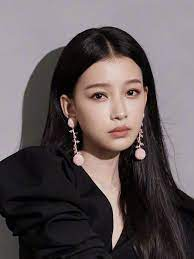

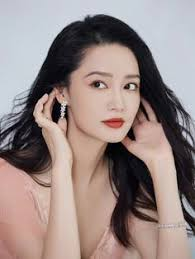

Similarity: 48.40812683105469% (Confidence: 99.99209594726562%)


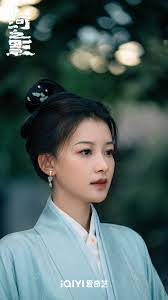

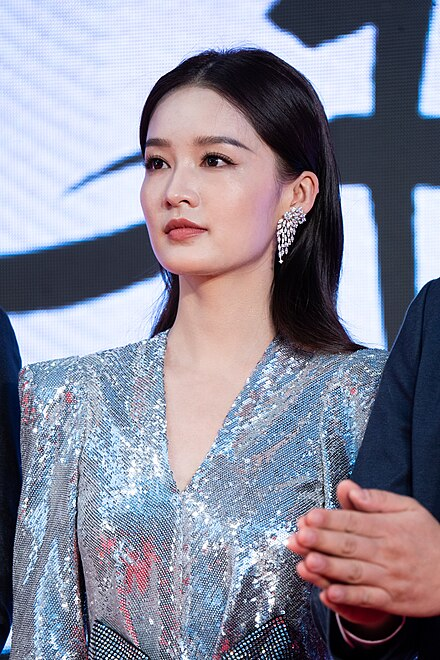

Similarity: 22.659652709960938% (Confidence: 99.99524688720703%)


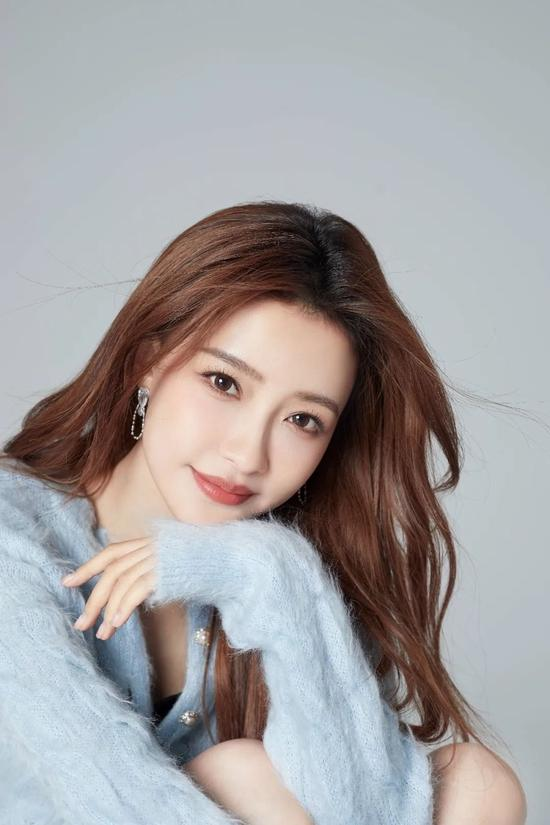

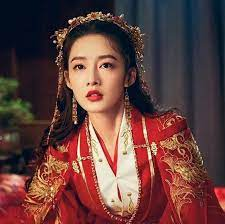

Similarity: 30.41731071472168% (Confidence: 99.9977798461914%)


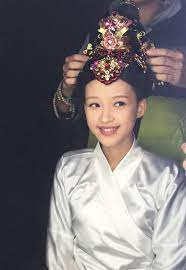

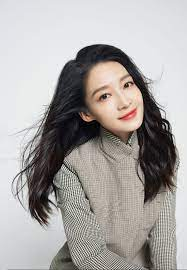

Similarity: 72.0408706665039% (Confidence: 99.99750518798828%)


{'sunyi3.jpeg, liqin3.jpeg': (36.197166442871094, 99.99784088134766),
 'sunyi1.jpeg, liqin5.jpeg': (48.40812683105469, 99.99209594726562),
 'sunyi4.jpeg, liqin1.jpg': (22.659652709960938, 99.99524688720703),
 'sunyi2.jpg, liqin4.jpeg': (30.41731071472168, 99.9977798461914),
 'sunyi5.jpeg, liqin2.jpeg': (72.0408706665039, 99.99750518798828)}

In [13]:
compare_celebs('sunyi', 'liqin')

## There is a lot of variance in the similarity scores, but generally they do not look highly similar

# Now let's try comparing ANOTHER pair of Chinese celebrities, this time male: Yang Yang vs Xing Zhaolin


File: yangyang1.jpeg, Match Name: Yang Yang, Match Confidence: 99.96455383300781


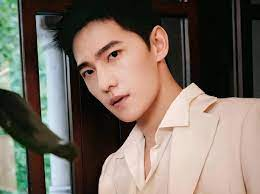

File: yangyang2.jpeg, Match Name: Yang Yang, Match Confidence: 97.15326690673828


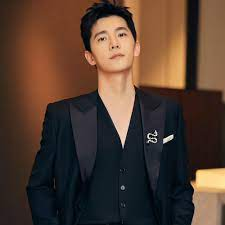

File: yangyang3.jpeg, Match Name: Yang Yang, Match Confidence: 99.9571762084961


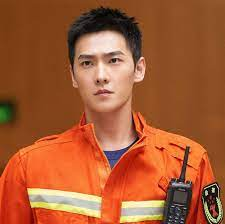

File: yangyang4.jpeg, Match Name: Yang Yang, Match Confidence: 99.89283752441406


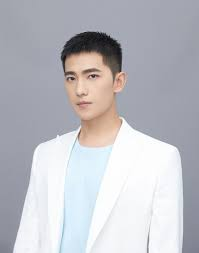

File: yangyang5.jpeg, Match Name: Yang Yang, Match Confidence: 99.9621353149414


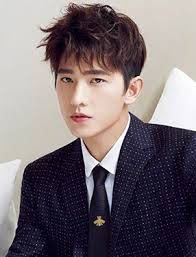

{'yangyang1.jpeg': ('Yang Yang', 99.96455383300781),
 'yangyang2.jpeg': ('Yang Yang', 97.15326690673828),
 'yangyang3.jpeg': ('Yang Yang', 99.9571762084961),
 'yangyang4.jpeg': ('Yang Yang', 99.89283752441406),
 'yangyang5.jpeg': ('Yang Yang', 99.9621353149414)}

In [14]:
recognize_celeb('yangyang')

## Here, we see that Rekognition correctly identifies Yang Yang!
# Now let's try with Xing Zhaolin

File: xingzhaolin1.jpeg, Match Name: Hu Yitian, Match Confidence: 92.68911743164062


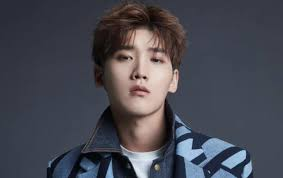

File: xingzhaolin2.jpeg, Match Name: Hu Yitian, Match Confidence: 97.8492660522461


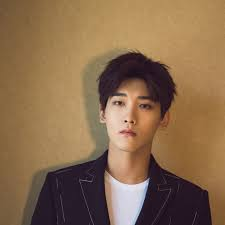

File: xingzhaolin3.jpeg, Match Name: Hu Yitian, Match Confidence: 89.9232406616211


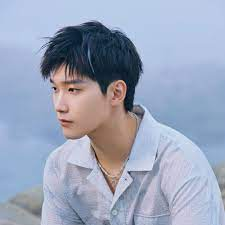

File: xingzhaolin4.jpeg, Match Name: Cheng Yi, Match Confidence: 96.85770416259766


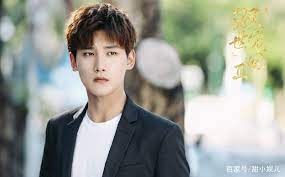

File: xingzhaolin5.jpeg, Match Name: Atomu Mizuishi, Match Confidence: 93.96524810791016


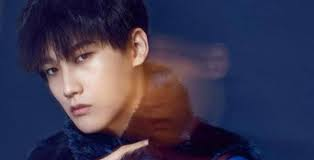

{'xingzhaolin1.jpeg': ('Hu Yitian', 92.68911743164062),
 'xingzhaolin2.jpeg': ('Hu Yitian', 97.8492660522461),
 'xingzhaolin3.jpeg': ('Hu Yitian', 89.9232406616211),
 'xingzhaolin4.jpeg': ('Cheng Yi', 96.85770416259766),
 'xingzhaolin5.jpeg': ('Atomu Mizuishi', 93.96524810791016)}

In [15]:
recognize_celeb('xingzhaolin')

## Yikes! It seems that all of these images were incorrectly identified, and they even confused a Chinese celebrity with a Japanese celebrity!

# Now let's compare the pair of celebrities

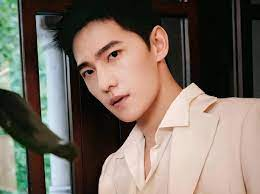

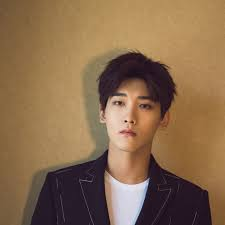

Similarity: 30.69664192199707% (Confidence: 99.99413299560547%)


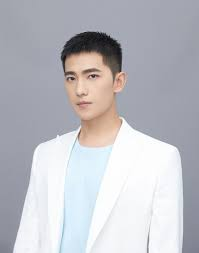

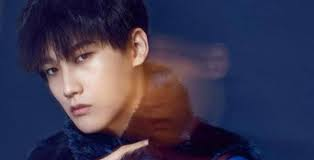

Similarity: 31.992412567138672% (Confidence: 99.9969711303711%)


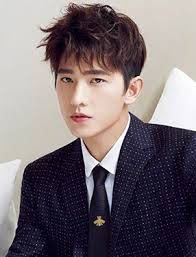

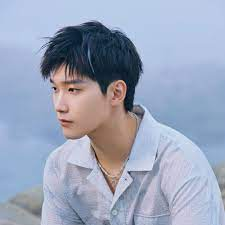

Similarity: 23.204280853271484% (Confidence: 99.99578094482422%)


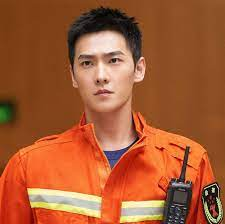

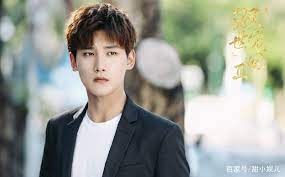

Similarity: 37.343746185302734% (Confidence: 99.99472045898438%)


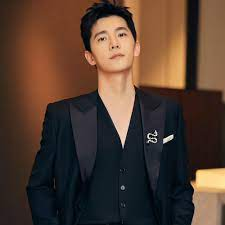

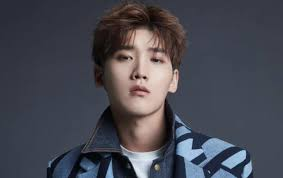

No matching faces found.


{'yangyang1.jpeg, xingzhaolin2.jpeg': (30.69664192199707, 99.99413299560547),
 'yangyang4.jpeg, xingzhaolin5.jpeg': (31.992412567138672, 99.9969711303711),
 'yangyang5.jpeg, xingzhaolin3.jpeg': (23.204280853271484, 99.99578094482422),
 'yangyang3.jpeg, xingzhaolin4.jpeg': (37.343746185302734, 99.99472045898438),
 'yangyang2.jpeg, xingzhaolin1.jpeg': (None, 0)}

In [16]:
compare_celebs('yangyang', 'xingzhaolin')

## We see that here similarity scores are pretty low. 

# Here, I created a function to streamline the process of celebrity comparison

# Let's try with the actress Zhang Jingyi

No celebrity matches found


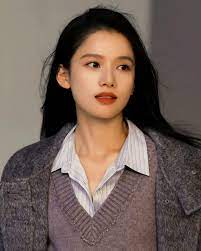

No celebrity matches found


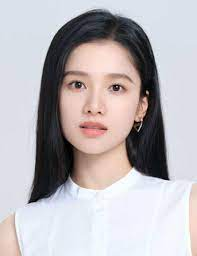

No celebrity matches found


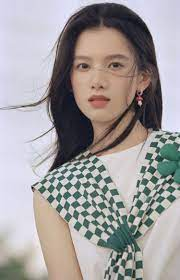

No celebrity matches found


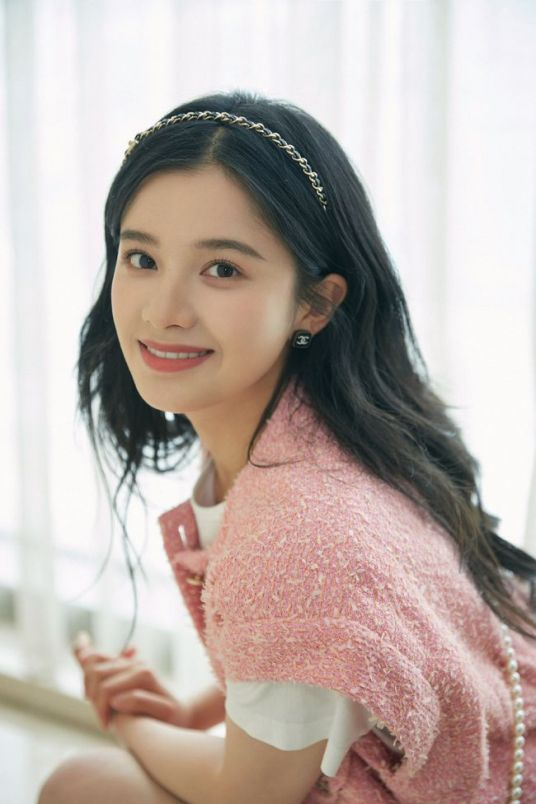

File: zhangjingyi5.jpeg, Match Name: Nana Asakawa, Match Confidence: 90.42198944091797


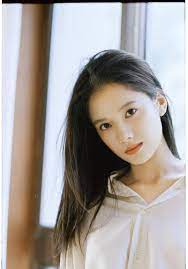

{'zhangjingyi1.jpeg': (None, 0),
 'zhangjingyi2.jpeg': (None, 0),
 'zhangjingyi3.jpeg': (None, 0),
 'zhangjingyi4.jpg': (None, 0),
 'zhangjingyi5.jpeg': ('Nana Asakawa', 90.42198944091797)}

In [17]:
recognize_celeb('zhangjingyi')

File: zhouye1.jpeg, Match Name: Lin Yun, Match Confidence: 81.95256042480469


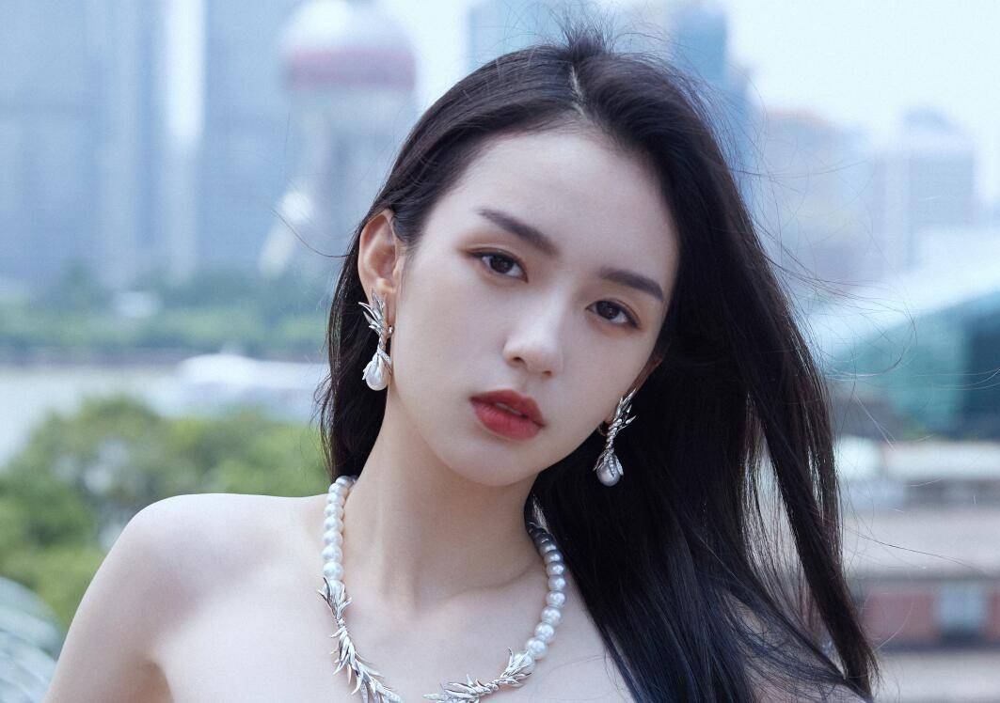

File: zhouye2.jpeg, Match Name: Liu Yan, Match Confidence: 85.2885513305664


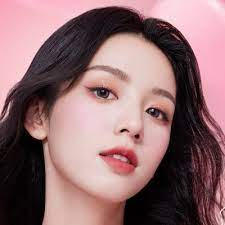

File: zhouye3.jpeg, Match Name: Miwako Kakei, Match Confidence: 87.53050231933594


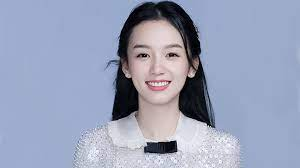

File: zhouye4.jpeg, Match Name: Zhang Xiyuan, Match Confidence: 79.4124526977539


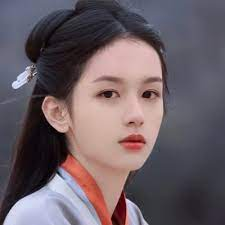

File: zhouye5.jpeg, Match Name: Zhang Xiyuan, Match Confidence: 85.55123138427734


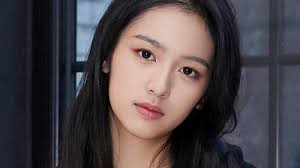

{'zhouye1.jpeg': ('Lin Yun', 81.95256042480469),
 'zhouye2.jpeg': ('Liu Yan', 85.2885513305664),
 'zhouye3.jpeg': ('Miwako Kakei', 87.53050231933594),
 'zhouye4.jpeg': ('Zhang Xiyuan', 79.4124526977539),
 'zhouye5.jpeg': ('Zhang Xiyuan', 85.55123138427734)}

In [18]:
recognize_celeb('zhouye')

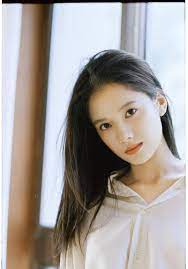

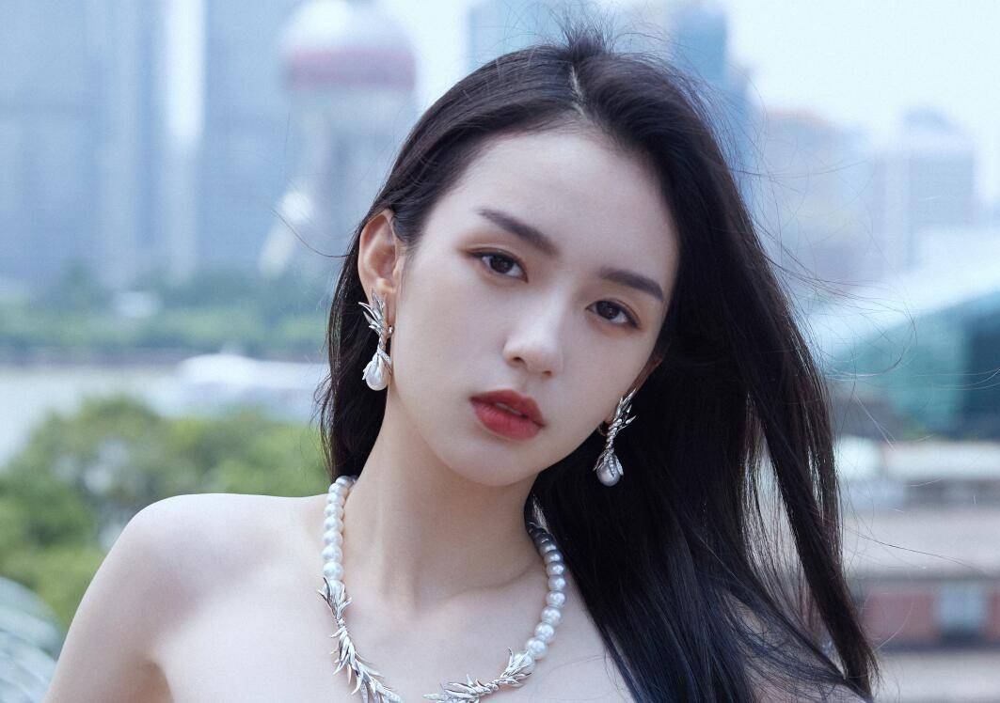

No matching faces found.


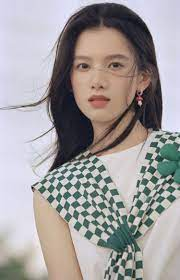

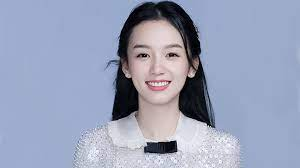

Similarity: 55.0308952331543% (Confidence: 99.99175262451172%)


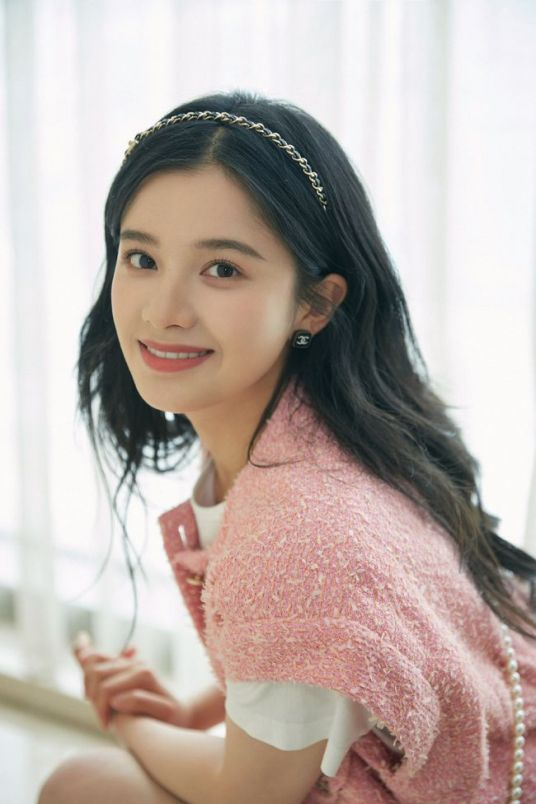

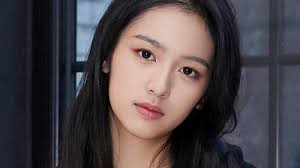

Similarity: 35.37895965576172% (Confidence: 99.99971008300781%)


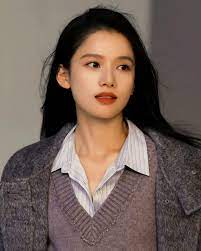

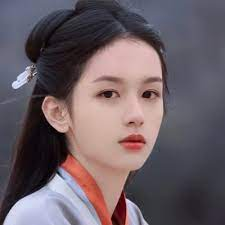

Similarity: 40.67125701904297% (Confidence: 99.99949645996094%)


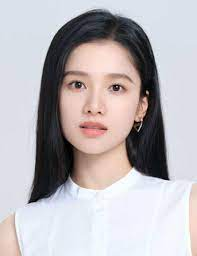

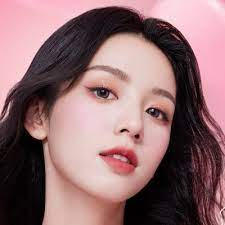

Similarity: 66.42048645019531% (Confidence: 99.99993896484375%)


{'zhangjingyi5.jpeg, zhouye1.jpeg': (None, 0),
 'zhangjingyi3.jpeg, zhouye3.jpeg': (55.0308952331543, 99.99175262451172),
 'zhangjingyi4.jpg, zhouye5.jpeg': (35.37895965576172, 99.99971008300781),
 'zhangjingyi1.jpeg, zhouye4.jpeg': (40.67125701904297, 99.99949645996094),
 'zhangjingyi2.jpeg, zhouye2.jpeg': (66.42048645019531, 99.99993896484375)}

In [19]:
compare_celebs('zhangjingyi', 'zhouye')

# Now let's try with some other celebrities

File: zhangziyi1.jpg, Match Name: Zhang Ziyi, Match Confidence: 92.73966217041016


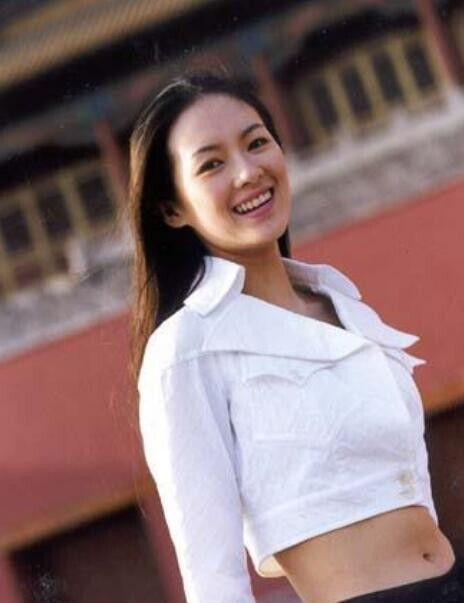

File: zhangziyi2.jpeg, Match Name: Zhang Ziyi, Match Confidence: 98.49909210205078


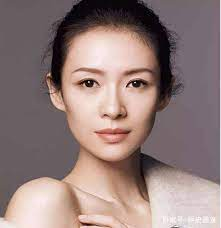

File: zhangziyi3.jpeg, Match Name: Zhang Ziyi, Match Confidence: 97.98323822021484


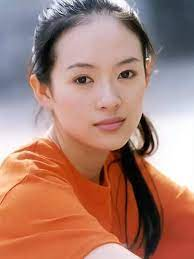

No celebrity matches found


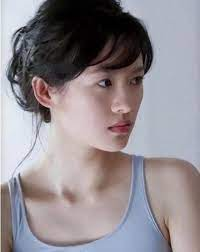

File: zhangziyi5.jpeg, Match Name: Zhang Ziyi, Match Confidence: 98.2824935913086


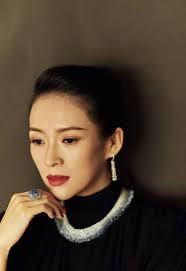

{'zhangziyi1.jpg': ('Zhang Ziyi', 92.73966217041016),
 'zhangziyi2.jpeg': ('Zhang Ziyi', 98.49909210205078),
 'zhangziyi3.jpeg': ('Zhang Ziyi', 97.98323822021484),
 'zhangziyi4.jpeg': (None, 0),
 'zhangziyi5.jpeg': ('Zhang Ziyi', 98.2824935913086)}

In [20]:
recognize_celeb('zhangziyi')



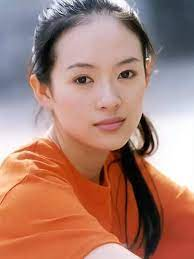

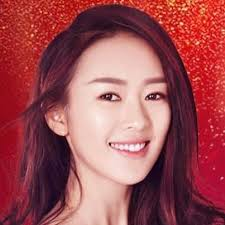

Similarity: 96.83446502685547% (Confidence: 99.99925994873047%)


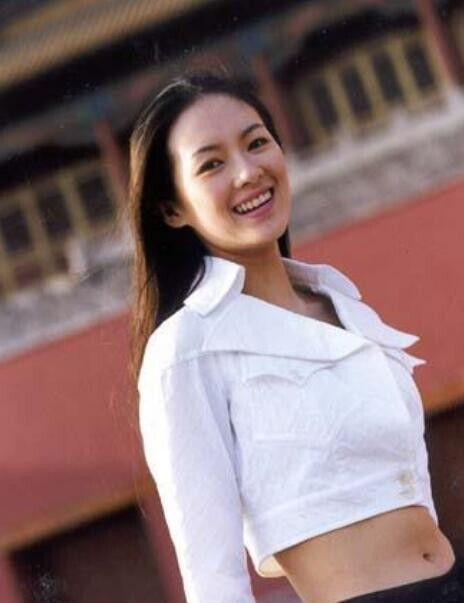

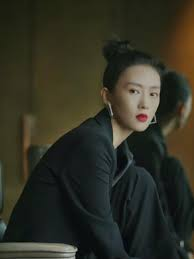

Similarity: 25.609811782836914% (Confidence: 99.9961166381836%)


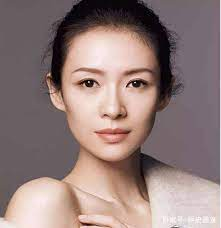

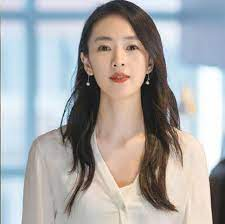

Similarity: 69.23503875732422% (Confidence: 99.9956283569336%)


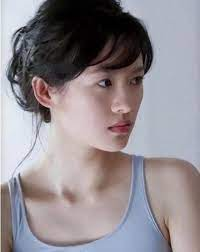

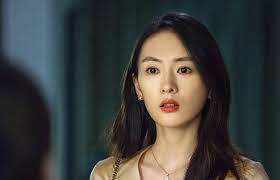

Similarity: 52.64027786254883% (Confidence: 99.99510192871094%)


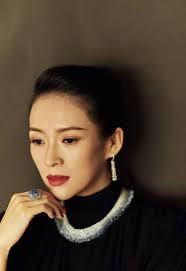

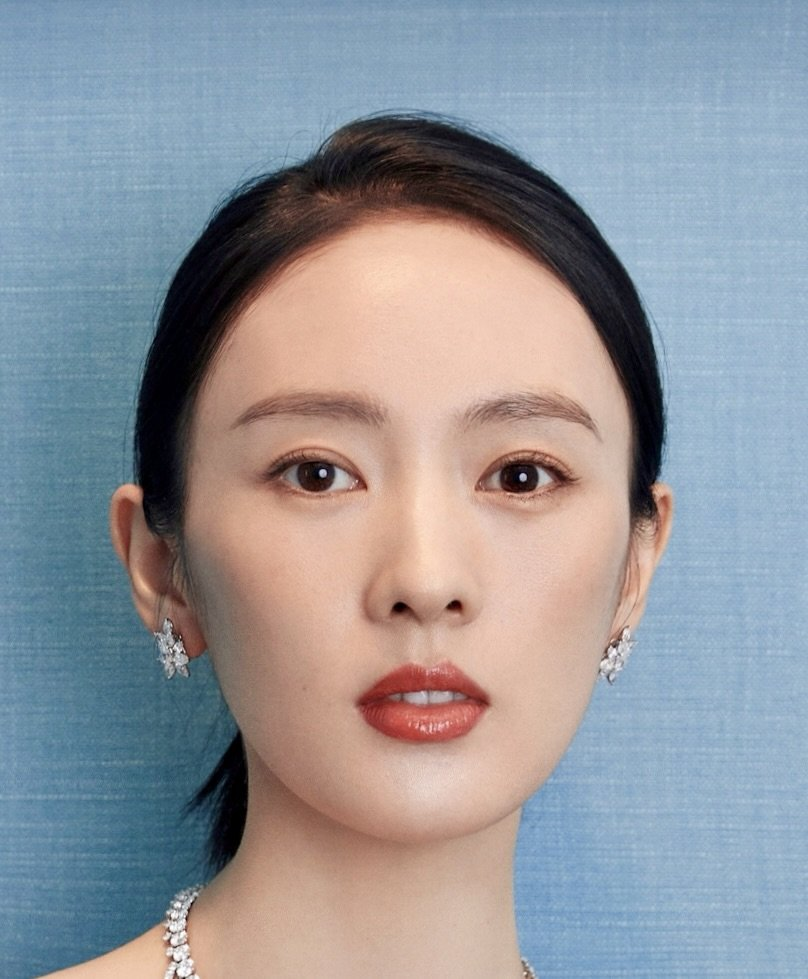

Similarity: 71.8835220336914% (Confidence: 99.99987030029297%)


{'zhangziyi3.jpeg, tongyao3.jpeg': (96.83446502685547, 99.99925994873047),
 'zhangziyi1.jpg, tongyao4.jpeg': (25.609811782836914, 99.9961166381836),
 'zhangziyi2.jpeg, tongyao2.jpeg': (69.23503875732422, 99.9956283569336),
 'zhangziyi4.jpeg, tongyao1.jpeg': (52.64027786254883, 99.99510192871094),
 'zhangziyi5.jpeg, tongyao5.jpg': (71.8835220336914, 99.99987030029297)}

In [21]:
compare_celebs('zhangziyi', 'tongyao')

# Compare Lu Han vs Neo Hou Minghao


File: luhan1.jpeg, Match Name: Hou Minghao, Match Confidence: 97.98165130615234


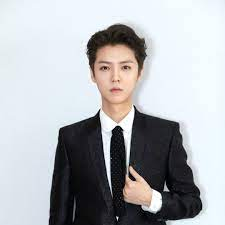

File: luhan2.jpeg, Match Name: Lu Han, Match Confidence: 98.36157989501953


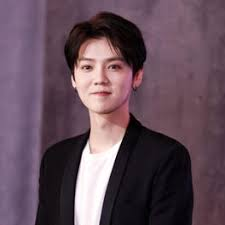

File: luhan3.jpeg, Match Name: Cho Jin-ho, Match Confidence: 96.7258529663086


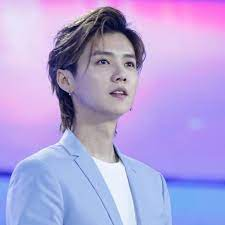

File: luhan4.jpeg, Match Name: Lu Han, Match Confidence: 96.15478515625


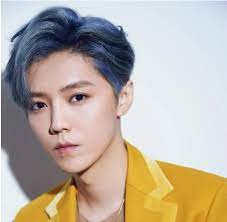

File: luhan5.jpeg, Match Name: Lu Han, Match Confidence: 99.11399841308594


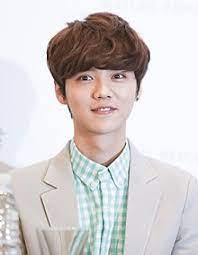

{'luhan1.jpeg': ('Hou Minghao', 97.98165130615234),
 'luhan2.jpeg': ('Lu Han', 98.36157989501953),
 'luhan3.jpeg': ('Cho Jin-ho', 96.7258529663086),
 'luhan4.jpeg': ('Lu Han', 96.15478515625),
 'luhan5.jpeg': ('Lu Han', 99.11399841308594)}

In [22]:
recognize_celeb('luhan')

File: neohouminghao1.jpeg, Match Name: Hou Minghao, Match Confidence: 99.772705078125


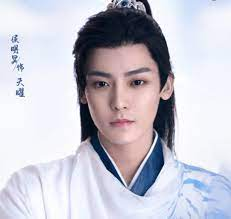

File: neohouminghao2.jpeg, Match Name: Hou Minghao, Match Confidence: 99.52217102050781


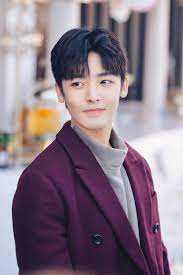

File: neohouminghao3.jpeg, Match Name: Hou Minghao, Match Confidence: 99.88167572021484


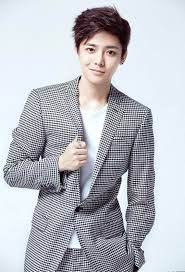

File: neohouminghao4.jpeg, Match Name: Hou Minghao, Match Confidence: 98.88813781738281


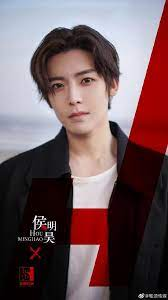

File: neohouminghao5.jpeg, Match Name: Hou Minghao, Match Confidence: 99.93456268310547


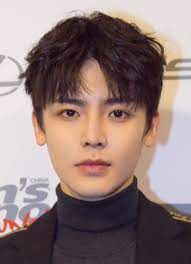

{'neohouminghao1.jpeg': ('Hou Minghao', 99.772705078125),
 'neohouminghao2.jpeg': ('Hou Minghao', 99.52217102050781),
 'neohouminghao3.jpeg': ('Hou Minghao', 99.88167572021484),
 'neohouminghao4.jpeg': ('Hou Minghao', 98.88813781738281),
 'neohouminghao5.jpeg': ('Hou Minghao', 99.93456268310547)}

In [23]:
recognize_celeb('neohou')

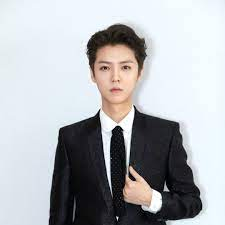

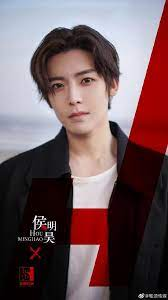

Similarity: 92.1351547241211% (Confidence: 99.98675537109375%)


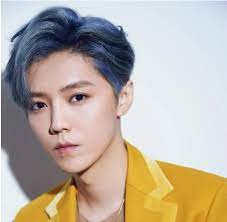

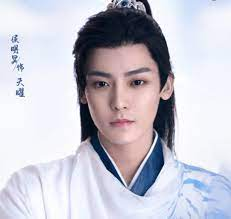

No matching faces found.


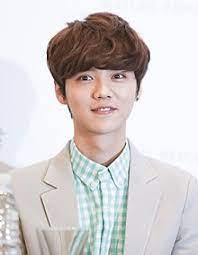

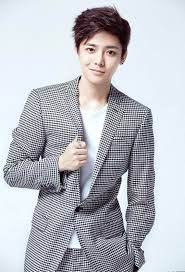

Similarity: 48.982818603515625% (Confidence: 99.97148895263672%)


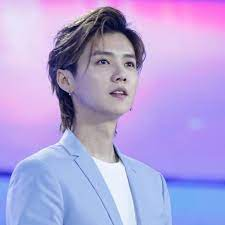

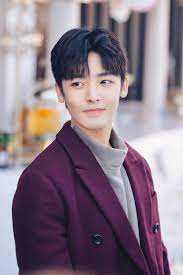

No matching faces found.


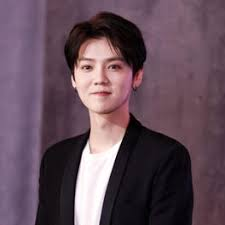

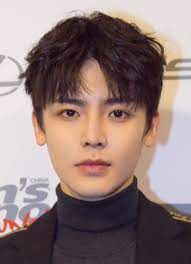

Similarity: 47.50442123413086% (Confidence: 99.9985580444336%)


{'luhan1.jpeg, neohouminghao4.jpeg': (92.1351547241211, 99.98675537109375),
 'luhan4.jpeg, neohouminghao1.jpeg': (None, 0),
 'luhan5.jpeg, neohouminghao3.jpeg': (48.982818603515625, 99.97148895263672),
 'luhan3.jpeg, neohouminghao2.jpeg': (None, 0),
 'luhan2.jpeg, neohouminghao5.jpeg': (47.50442123413086, 99.9985580444336)}

In [24]:
compare_celebs('luhan', 'neohou')

# Compare Arthur Chen vs Kris Wu

File: arthurchen1.jpeg, Match Name: Ayanga, Match Confidence: 95.37425994873047


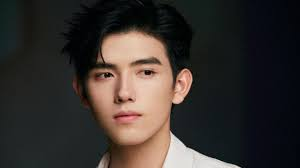

File: arthurchen2.jpeg, Match Name: Ayanga, Match Confidence: 92.52190399169922


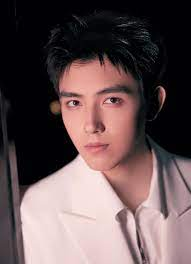

File: arthurchen3.jpeg, Match Name: Xiao Zhan, Match Confidence: 95.36692810058594


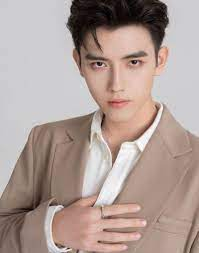

File: arthurchen4.jpeg, Match Name: Derek Chang, Match Confidence: 90.13340759277344


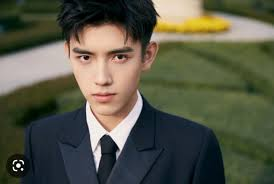

File: arthurchen5.jpeg, Match Name: Ayanga, Match Confidence: 77.67327880859375


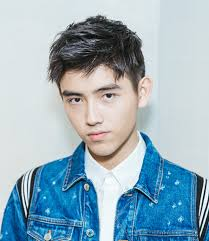

{'arthurchen1.jpeg': ('Ayanga', 95.37425994873047),
 'arthurchen2.jpeg': ('Ayanga', 92.52190399169922),
 'arthurchen3.jpeg': ('Xiao Zhan', 95.36692810058594),
 'arthurchen4.jpeg': ('Derek Chang', 90.13340759277344),
 'arthurchen5.jpeg': ('Ayanga', 77.67327880859375)}

In [25]:
recognize_celeb('arthurchen')

File: kriswu1.jpeg, Match Name: Kris Wu, Match Confidence: 97.77727508544922


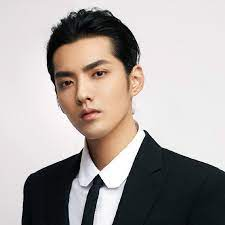

File: kriswu2.jpeg, Match Name: Kris Wu, Match Confidence: 93.0302963256836


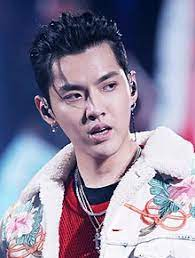

File: kriswu3.jpeg, Match Name: Derek Chang, Match Confidence: 93.15306854248047


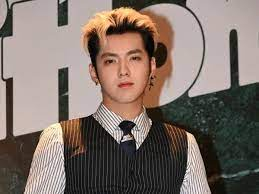

File: kriswu4.jpeg, Match Name: Kris Wu, Match Confidence: 96.81078338623047


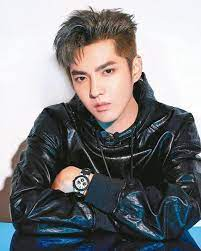

File: kriswu5.jpeg, Match Name: Xiao Zhan, Match Confidence: 96.54936218261719


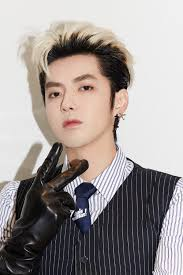

{'kriswu1.jpeg': ('Kris Wu', 97.77727508544922),
 'kriswu2.jpeg': ('Kris Wu', 93.0302963256836),
 'kriswu3.jpeg': ('Derek Chang', 93.15306854248047),
 'kriswu4.jpeg': ('Kris Wu', 96.81078338623047),
 'kriswu5.jpeg': ('Xiao Zhan', 96.54936218261719)}

In [26]:
recognize_celeb('kriswu')

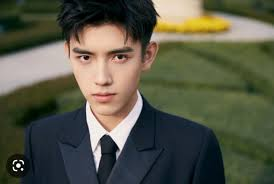

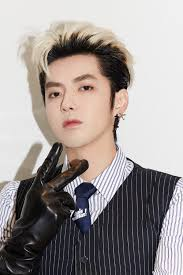

Similarity: 39.53234100341797% (Confidence: 99.9938735961914%)


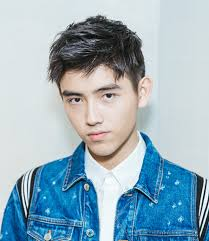

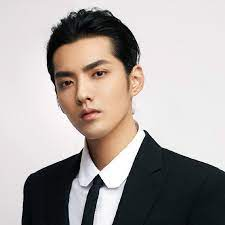

No matching faces found.


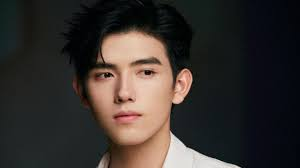

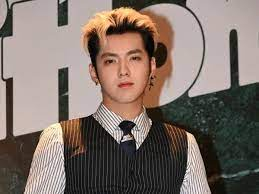

Similarity: 68.02067565917969% (Confidence: 99.99629211425781%)


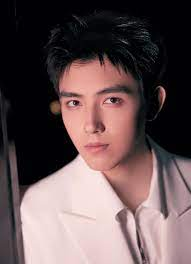

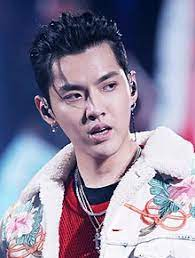

Similarity: 22.390939712524414% (Confidence: 99.99925994873047%)


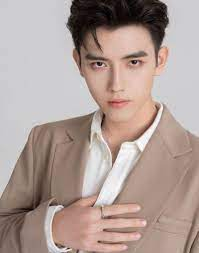

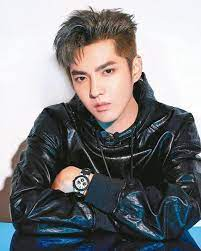

Similarity: 32.16319274902344% (Confidence: 99.99752044677734%)


{'arthurchen4.jpeg, kriswu5.jpeg': (39.53234100341797, 99.9938735961914),
 'arthurchen5.jpeg, kriswu1.jpeg': (None, 0),
 'arthurchen1.jpeg, kriswu3.jpeg': (68.02067565917969, 99.99629211425781),
 'arthurchen2.jpeg, kriswu2.jpeg': (22.390939712524414, 99.99925994873047),
 'arthurchen3.jpeg, kriswu4.jpeg': (32.16319274902344, 99.99752044677734)}

In [27]:
compare_celebs('arthurchen', 'kriswu')